In [1]:
import jax

# jax.config.update("jax_enable_x64", False)
jax.config.update("jax_enable_x64", True)
# jax.config.update("jax_platform_name", "cpu")
jax.config.update("jax_platform_name", "gpu")
# jax.config.update("jax_debug_nans", True)
print(jax.local_devices()[0].device_kind)
from jax import numpy as np, random as jr, tree as jtu
import os


from zodiax.optimisation import sgd, adam

import amigo
import dorito


# visualisation
import matplotlib.pyplot as plt
import matplotlib as mpl
import ehtplot
import scienceplots
import cmasher as cmr

# matplotlib parameters
plt.style.use(["science", "bright", "no-latex"])

plt.rcParams["image.cmap"] = "inferno"
plt.rcParams["font.family"] = "serif"
plt.rcParams["image.origin"] = "lower"
plt.rcParams["figure.dpi"] = 300
plt.rcParams["font.size"] = 8
plt.rcParams["xtick.direction"] = "out"
plt.rcParams["ytick.direction"] = "out"

inferno = mpl.colormaps["inferno"]
viridis = mpl.colormaps["viridis"]
seismic = mpl.colormaps["seismic"]
coolwarm = mpl.colormaps["coolwarm"]

inferno.set_bad("k", 0.5)
viridis.set_bad("k", 0.5)
seismic.set_bad("k", 0.5)
coolwarm.set_bad("k", 0.5)

NVIDIA GeForce RTX 2080 Ti


/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/amigo/optical_models.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources as pkg


In [3]:
from socket import gethostname

if gethostname() == "glinton":
    morgana = "/media/morgana1/"
else:
    morgana = "/Volumes/morgana1/"

data_path = os.path.join(morgana, "snert/max/data/JWST/IO/calslope/")
uncal_path = os.path.join(morgana, "snert/max/data/JWST/IO/uncal/")
amigo_cache = os.path.join(morgana, "snert/max/data/amigo_files/")

cache = os.path.join(amigo_cache, "v_0.0.10/")
output_path = os.path.join(amigo_cache, "outputs/IO/")

EXP_TYPE = "NIS_AMI"
FILTERS = [
    "F480M",
    "F430M",
    "F380M",
    # "F277W",
]

# Bind file path, type and exposure type
file_fn = lambda data_path, filters=FILTERS, **kwargs: amigo.files.get_files(
    # "/Users/mcha5804/JWST/ERS1373/calgrps/",
    data_path,
    "calslope",
    EXP_TYPE=EXP_TYPE,
    FILTER=filters,
    **kwargs,
)

# Loading in data

In [4]:
files = sorted(
    file_fn(data_path), key=lambda hdu: hdu[0].header.get("EXPMID", float("inf"))
)

sci_files = []
cal_files = []

for file in files:
    filename = file[0].header["FILENAME"].replace("_nis_calslope.fits", "")

    # manual bad pixel correction
    file["BADPIX"].data[58, 67] = 1
    file["BADPIX"].data[71, 22] = 1
    file["BADPIX"].data[65, 41] = 1
    file["BADPIX"].data[35, 70] = 1
    file["BADPIX"].data[70, 55] = 1
    file["BADPIX"].data[5, 5] = 1
    file["BADPIX"].data[-4, 37] = 1
    file["BADPIX"].data[51, 27] = 1
    file["BADPIX"].data[28, 18] = 1
    file["BADPIX"].data[32, 10] = 1

    file["BADPIX"].data[:, :3] = 1
    file["BADPIX"].data[:, -3:] = 1
    file["BADPIX"].data[:3, :] = 1
    file["BADPIX"].data[-3:, :] = 1

    # if file[0].header["TARGPROP"] == "NGC1068":
    if not bool(file[0].header["IS_PSF"]):
        sci_files.append(file)
    elif bool(file[0].header["IS_PSF"]):
        file[0].header["TARGPROP"] = "HD 2236"
        cal_files.append(file)
    else:
        print(f"Unkown target: {file[0].header['TARGPROP']}")

# dorito.misc.truncate_files(cal_files, 5)
dorito.misc.truncate_files(sci_files, 18)

In [5]:
from astropy.time import Time

for file in files:
    h = file[0].header
    t = Time(h["EXPMID"], format="mjd")
    print(
        f'{h["TARGPROP"]} {h["FILTER"]}, Dither {h["PATT_NUM"]}/{h["NUMDTHPT"]}, Roll {h["ROLL_REF"]:.1f}deg, {h["XPOSURE"] / 60:.1f}min, {t.iso}'
    )

IO F430M, Dither 1/5, Roll 247.4deg, 5.7min, 2022-08-01 16:35:16.729
IO F430M, Dither 2/5, Roll 247.4deg, 5.7min, 2022-08-01 16:43:49.689
IO F430M, Dither 3/5, Roll 247.4deg, 5.7min, 2022-08-01 16:52:22.840
IO F430M, Dither 4/5, Roll 247.4deg, 5.7min, 2022-08-01 17:00:55.736
IO F430M, Dither 5/5, Roll 247.4deg, 5.7min, 2022-08-01 17:09:28.759
HD 2236 F430M, Dither 1/4, Roll 247.4deg, 0.1min, 2022-08-01 17:53:41.546
HD 2236 F430M, Dither 2/4, Roll 247.4deg, 0.1min, 2022-08-01 17:55:01.418
HD 2236 F430M, Dither 3/4, Roll 247.4deg, 0.1min, 2022-08-01 17:56:21.290
HD 2236 F430M, Dither 4/4, Roll 247.4deg, 0.1min, 2022-08-01 17:57:39.114


In [6]:
load_dict = lambda x: np.load(f"{x}", allow_pickle=True).item()

cal_exposures = [amigo.model_fits.SplineVisFit(file) for file in cal_files]
sci_exposures = [amigo.model_fits.SplineVisFit(file) for file in sci_files]
exposures = cal_exposures + sci_exposures


model = amigo.core_models.AmigoModel(
    exposures,
    optics=amigo.optical_models.AMIOptics(),
    detector=amigo.detector_models.LinearDetector(),
    ramp_model=amigo.ramp_models.NonLinearRamp(),
    read=amigo.read_models.ReadModel(),
    vis_model=amigo.vis_models.LogVisModel(
        load_dict(cache + "vis_basis.npy"), n_basis=420
    ),
    state=load_dict(cache + "calibration.npy"),
)

In [7]:
# for exp in exposures:
#     exp.print_summary()
#     amigo.plotting.summarise_fit(model, exp, residuals=False)

In [7]:
# pos_keys = []
spc_keys = []
for exp in exposures:
    if not exp.calibrator:
        # pos_keys.append(exp.map_param("positions"))
        spc_keys.append(exp.map_param("spectra"))


def norm_fn(model_params, args):
    params = model_params.params
    # if "log_distribution" in params.keys():
    #     for k, log_dist in params["log_distribution"].items():
    #         distribution = 10**log_dist
    #         params["log_distribution"][k] = np.log10(distribution / distribution.sum())

    if "spectra" in params.keys():
        spectra = jtu.map(
            lambda x: np.clip(x, a_min=-0.8, a_max=0.8), params["spectra"]
        )
        params["spectra"] = spectra

    return model_params.set("params", params), args


pscale = lambda model: model.optics.psf_pixel_scale / model.optics.oversample

In [11]:
n_epoch = 1000

config = {
    "positions": sgd(4e-2, 0),
    "fluxes": sgd(2e-2, 0),
    "aberrations": sgd(5e-2, 4),
    "spectra": sgd(3e-2, 10),
    "phases": sgd(2e0, 50),
    "amplitudes": sgd(2e0, 50),
}


def grad_fn(model, grads, args):
    # # Nuke the position gradients for the science exposures
    # if "positions" in config.keys():
    #     grads = grads.multiply(pos_keys, 0.0)

    # Reduce spectra gradients for the science exposures
    if "spectra" in config.keys():
        grads = grads.multiply(spc_keys, 1e-2)
    return grads, args


trainer = amigo.fitting.Trainer(
    cache=os.path.join(amigo_cache, "fishers/"),
    grad_fn=grad_fn,
)

trainer = trainer.populate_fishers(
    model,
    exposures,
    hessians=load_dict(cache + "jacobians.npy")["hessian"],
    parameters=list(config.keys()),
)

print("Number of exposures: ", len(exposures))

# # Train the model
# result = trainer.train(
#     model=model,
#     optimisers=config,
#     epochs=n_epoch,
#     batches=amigo.fitting.batch_exposures(exposures, n_batch=len(exposures) // 3),
# )

Number of exposures:  9


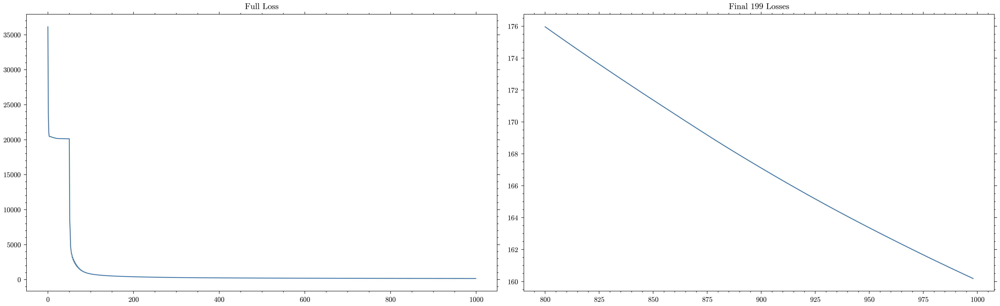

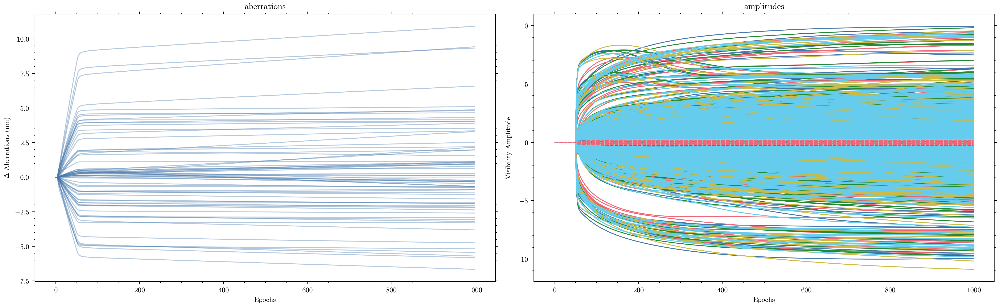

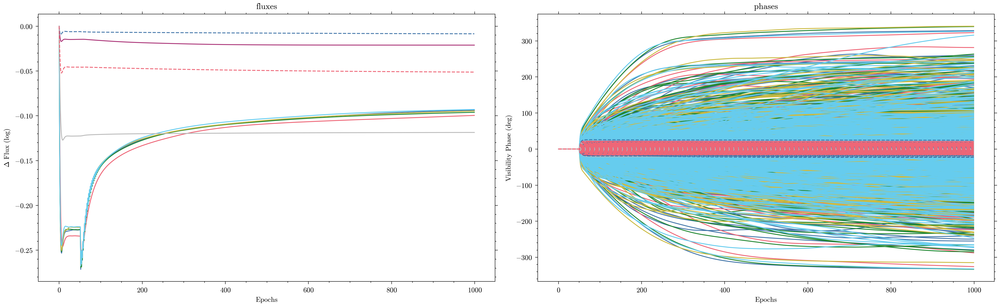

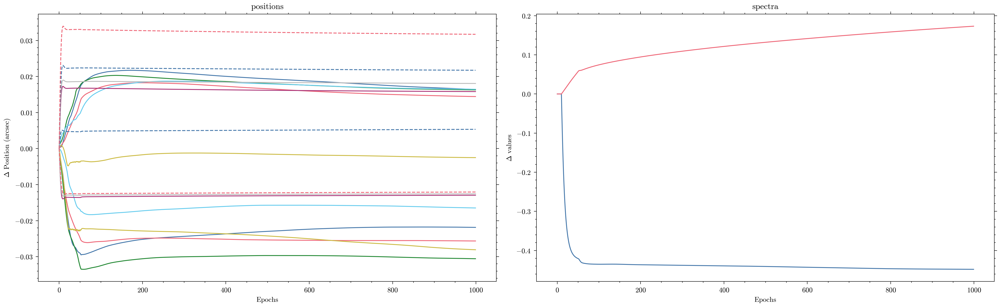

HD 2236


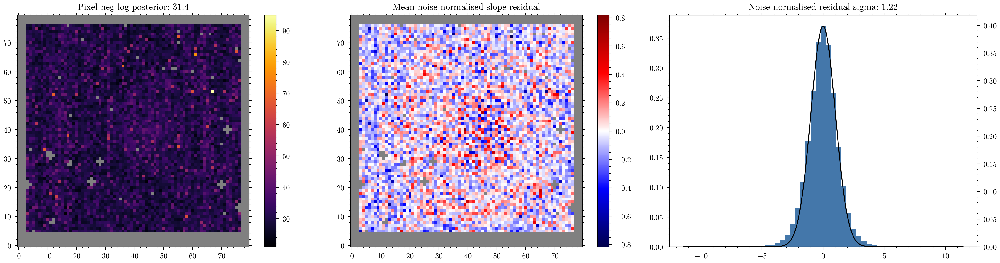

HD 2236


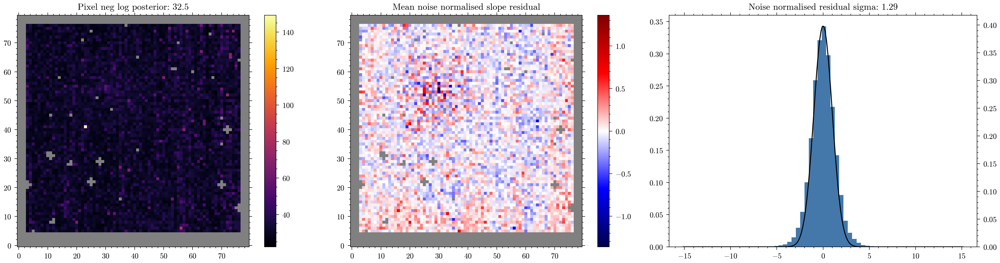

HD 2236


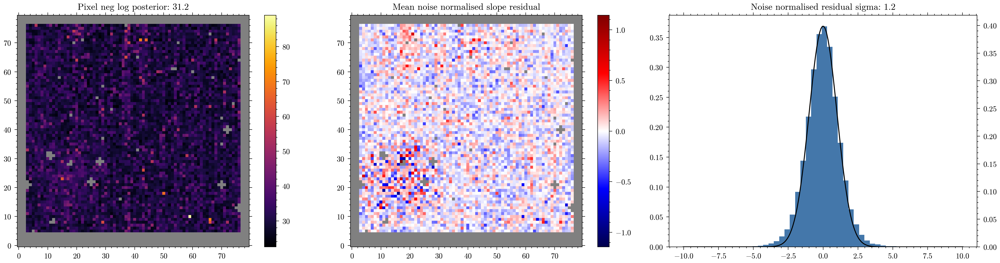

HD 2236


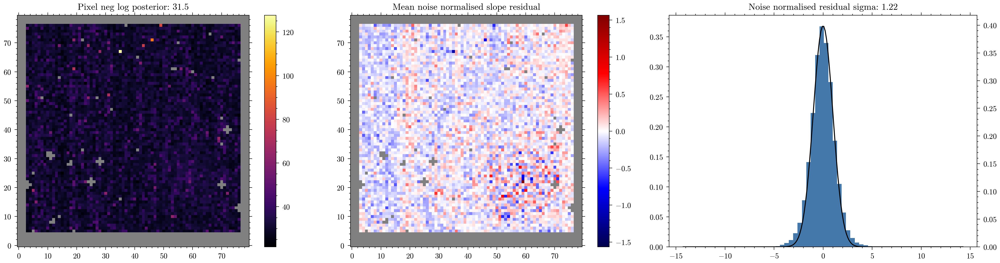

IO


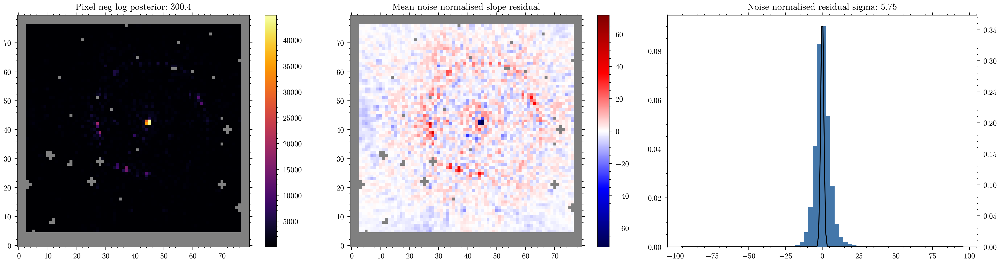

IO


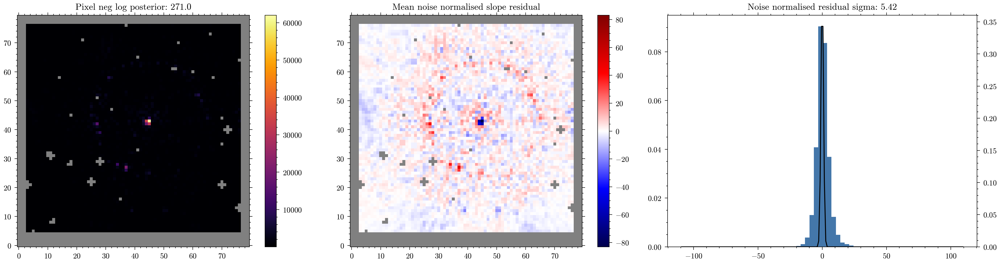

IO


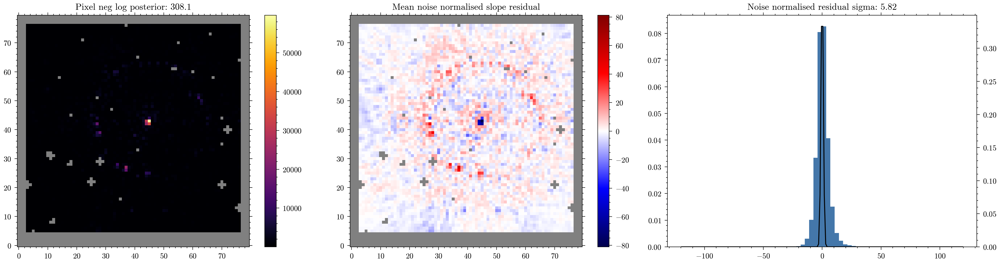

IO


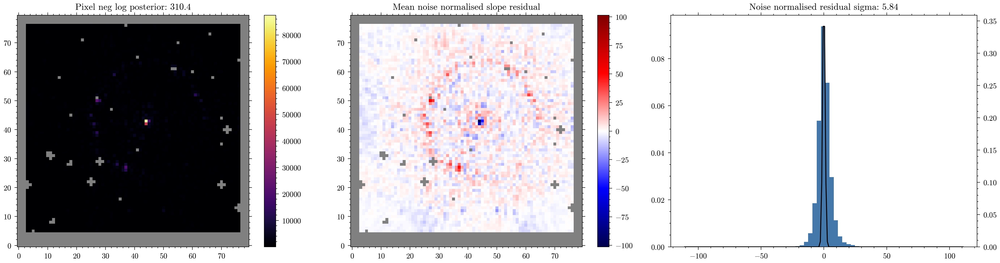

IO


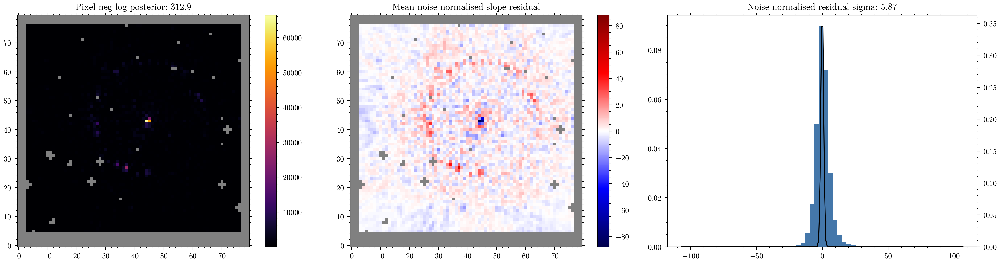

In [9]:
losses = np.array([v for v in result.losses.values()]).mean(0)

amigo.plotting.plot_losses(losses, start=int(0.8 * n_epoch))
amigo.plotting.plot(result.history)

# for exp in exposures:
for exp in exposures:
    print(exp.star)
    amigo.plotting.summarise_fit(result.model, exp)

In [8]:
# np.save(output_path + "sceondtbigrun.npy", result.model.params, allow_pickle=True)

# final_model = result.model

final_model = model.set(
    "params", np.load(output_path + "sceondtbigrun.npy", allow_pickle=True).item()
)

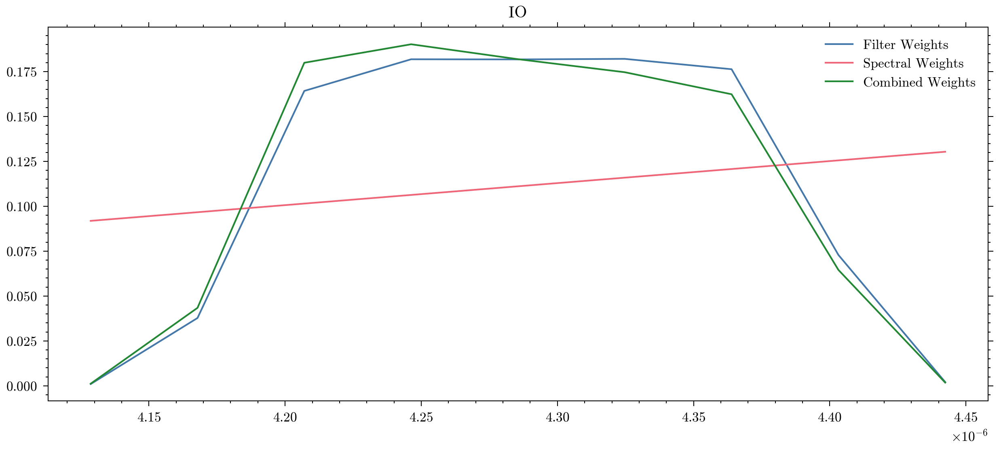

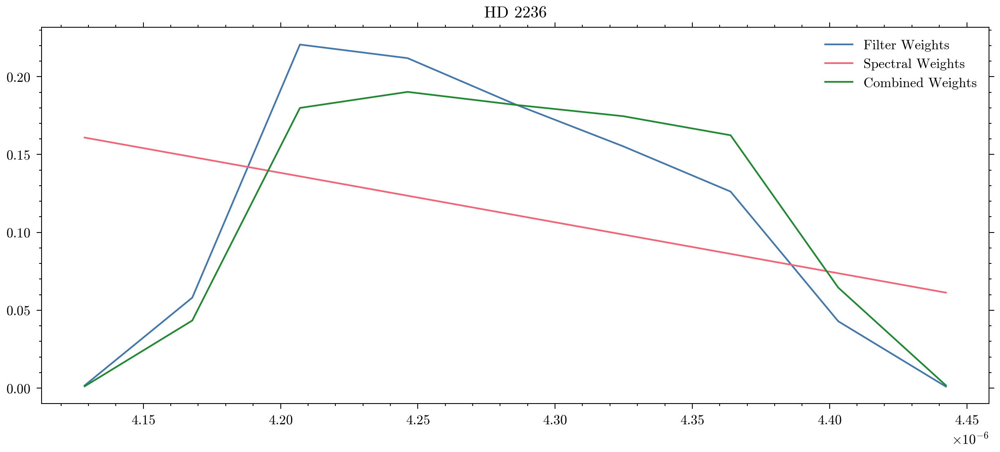

In [9]:
stars = list(set([exp.star for exp in exposures]))

for targ_star in stars:
    plt.figure(figsize=(10, 4))
    plt.title(f"{targ_star}")
    for key, spec in final_model.spectra.items():
        star, filt = key.split("_")

        if star != targ_star:
            continue

        wavels, filt_weights = model.filters[filt]
        xs = np.linspace(-1, 1, len(wavels), endpoint=True)
        spectra_slopes = 1 + spec * xs
        weights = filt_weights * spectra_slopes  # * wavels

        #
        filt_weights = filt_weights / filt_weights.sum()
        spectra_slopes = spectra_slopes / spectra_slopes.sum()
        weights = weights / weights.sum()

        plt.plot(wavels, weights, label="Filter Weights")
        plt.plot(wavels, spectra_slopes, label="Spectral Weights")
        plt.plot(wavels, filt_weights, label="Combined Weights")

    plt.legend()
    plt.show()

In [12]:
import equinox as eqx
import optimistix as optx
from amigo.core_models import ModelParams


def get_proj_mat(fmat):
    """Get the projection matrix for a Fisher matrix"""
    eig_vals, eig_vecs = np.linalg.eig(-fmat)
    return (eig_vals.real**-0.5)[:, None] * eig_vecs.real.T


proj_mats = jtu.map(get_proj_mat, trainer.fishers)


@eqx.filter_jit
def fun(params, args):
    model, exp, model_params, proj_mats, shapes = args

    # Project and add the parameters
    proj_params = jtu.map(lambda x, y: np.dot(x, y), proj_mats, params)
    model_params = jtu.map(lambda x, y: x + y, model_params, proj_params)
    model_params = jtu.map(lambda x, y: x.reshape(y), model_params, shapes)
    model = model_params.inject(model)

    # Return the loss
    return -np.nanmean(exp.mv_zscore(model))


params = ["amplitudes", "phases", "fluxes", "spectra"]
# final_model = result.model

args_out = {}
sols_out = {}
for exp in exposures:
    opt_params = {}
    fishers = {}
    shapes = {}
    for param in params:
        key = exp.map_param(param)
        shapes[key] = final_model.get(key).shape
        opt_params[key] = final_model.get(key).flatten()
        fishers[key] = trainer.fishers[f"{exp.key}.{param}"]

    shapes = ModelParams(shapes)
    model_params = ModelParams(opt_params)
    initial_params = jtu.map(lambda x: np.zeros_like(x), model_params)
    proj_mats = jtu.map(get_proj_mat, ModelParams(fishers))
    proj_mats = jtu.map(lambda x: np.where(np.isnan(x) | np.isinf(x), 0, x), proj_mats)

    args = (final_model, exp, model_params, proj_mats, shapes)
    args_out[exp.key] = args

    try:
        print("Initial loss:", fun(initial_params, args))
    except Exception as e:
        print(f"Skipped {exp.key}")
        continue
    solver = optx.BFGS(rtol=1e-6, atol=1e-6)
    sol = optx.minimise(fun, solver, initial_params, args, throw=False, max_steps=2048)
    sols_out[exp.key] = sol

    print("Final loss:", fun(sol.value, args))
    print(sol.stats["num_steps"], sol.state.num_accepted_steps)
    print(optx.RESULTS[sol.result])
    print()

Initial loss: 8.147700663929463
Final loss: 8.147389030896678
1897 486


Initial loss: 9.170281556151547
Final loss: 9.170148516506696
582 176


Initial loss: 7.956836406827704
Final loss: 7.956781610688932
1446 512


Initial loss: 8.134477882796196
Final loss: 8.134245285968596
1191 397


Initial loss: 281.4358087049294
Final loss: 53.978673601675204
2048 2043
The maximum number of steps was reached in the nonlinear solver. The problem may not be solveable (e.g., a root-find on a function that has no roots), or you may need to increase `max_steps`.

Initial loss: 251.22810861780934
Final loss: 65.43365720775465
2048 2046
The maximum number of steps was reached in the nonlinear solver. The problem may not be solveable (e.g., a root-find on a function that has no roots), or you may need to increase `max_steps`.

Initial loss: 289.12838182120043
Final loss: 72.41318477686495
2048 2044
The maximum number of steps was reached in the nonlinear solver. The problem may not be solveable (e.g.,

E0630 13:41:13.163090  984267 pjrt_stream_executor_client.cc:2839] Execution of replica 0 failed: INTERNAL: CpuCallback error calling callback: Traceback (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main
  File "<frozen runpy>", line 88, in _run_code
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/ipykernel_launcher.py", line 18, in <module>
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/traitlets/config/application.py", line 1075, in launch_instance
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/ipykernel/kernelapp.py", line 739, in start
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/tornado/platform/asyncio.py", line 211, in start
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/asyncio/base_events.py", line 683, in run_forever
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/asyncio/base_events.py", line 2042, in _run_once
  File "/home/max/miniforge3/envs/n

EquinoxRuntimeError: Above is the stack outside of JIT. Below is the stack inside of JIT:
  File "<frozen runpy>", line 198, in _run_module_as_main
  File "<frozen runpy>", line 88, in _run_code
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/ipykernel_launcher.py", line 18, in <module>
    app.launch_new_instance()
    ~~~~~~~~~~~~~~~~~~~~~~~^^
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/traitlets/config/application.py", line 1075, in launch_instance
    app.start()
    ~~~~~~~~~^^
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/ipykernel/kernelapp.py", line 739, in start
    self.io_loop.start()
    ~~~~~~~~~~~~~~~~~~^^
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/tornado/platform/asyncio.py", line 211, in start
    self.asyncio_loop.run_forever()
    ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~^^
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/asyncio/base_events.py", line 683, in run_forever
    self._run_once()
    ~~~~~~~~~~~~~~^^
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/asyncio/base_events.py", line 2042, in _run_once
    handle._run()
    ~~~~~~~~~~~^^
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/asyncio/events.py", line 89, in _run
    self._context.run(self._callback, *self._args)
    ~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/ipykernel/kernelbase.py", line 545, in dispatch_queue
    await self.process_one()
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/ipykernel/kernelbase.py", line 534, in process_one
    await dispatch(*args)
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/ipykernel/kernelbase.py", line 437, in dispatch_shell
    await result
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/ipykernel/ipkernel.py", line 362, in execute_request
    await super().execute_request(stream, ident, parent)
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/ipykernel/kernelbase.py", line 778, in execute_request
    reply_content = await reply_content
                    ^^^^^^^^^^^^^^^^^^^
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/ipykernel/ipkernel.py", line 449, in do_execute
    res = shell.run_cell(
        code,
    ...<2 lines>...
        cell_id=cell_id,
    )
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/ipykernel/zmqshell.py", line 549, in run_cell
    return super().run_cell(*args, **kwargs)
           ~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/IPython/core/interactiveshell.py", line 3100, in run_cell
    result = self._run_cell(
        raw_cell, store_history, silent, shell_futures, cell_id
    )
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/IPython/core/interactiveshell.py", line 3155, in _run_cell
    result = runner(coro)
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/IPython/core/async_helpers.py", line 128, in _pseudo_sync_runner
    coro.send(None)
    ~~~~~~~~~^^^^^^
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/IPython/core/interactiveshell.py", line 3367, in run_cell_async
    has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
                 ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
           interactivity=interactivity, compiler=compiler, result=result)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/IPython/core/interactiveshell.py", line 3612, in run_ast_nodes
    if await self.run_code(code, result, async_=asy):
       ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/IPython/core/interactiveshell.py", line 3672, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
    ~~~~^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/tmp/ipykernel_984267/1344004363.py", line 54, in <module>
    print("Initial loss:", fun(initial_params, args))
                           ~~~^^^^^^^^^^^^^^^^^^^^^^
  File "/tmp/ipykernel_984267/1344004363.py", line 26, in fun
    return -np.nanmean(exp.mv_zscore(model))
                       ~~~~~~~~~~~~~^^^^^^^
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/amigo/model_fits.py", line 167, in mv_zscore
    slopes = self(model)
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/amigo/model_fits.py", line 375, in __call__
    return self.simulate(model, return_slopes=return_slopes).data
           ~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/amigo/model_fits.py", line 365, in simulate
    psf = self.model_psf(model)
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/amigo/model_fits.py", line 415, in model_psf
    wfs = self.model_wfs(model)
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/amigo/model_fits.py", line 309, in model_wfs
    wfs = eqx.filter_jit(optics.propagate)(wavels, pos, weights, return_wf=True)
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/dLux/optical_systems.py", line 189, in propagate
    wf = filter_vmap(prop_fn)(wavelengths, weights)
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/dLux/optical_systems.py", line 186, in <lambda>
    prop_fn = lambda wavelength, weight: self.propagate_mono(
                                         ~~~~~~~~~~~~~~~~~~~^
        wavelength, offset, return_wf=True
        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
    ).multiply("amplitude", weight**0.5)
    ^
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/amigo/optical_models.py", line 590, in propagate_mono
    psf = interp(wf.psf, knots, sample_coords, "cubic2")
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/amigo/misc.py", line 189, in interp
    return ipx.interp2d(ypts, xpts, ys[:, 0], xs[0], image, method=method, extrap=fill).reshape(
           ~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/interpax/_spline.py", line 753, in interp2d
    fx = approx_df(x, f, method, 0, **kwargs)
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/interpax/_fd_derivs.py", line 49, in approx_df
    out = _cubic2(x, f, axis, bc=bc, dtype=dtype)
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/interpax/_fd_derivs.py", line 286, in _cubic2
    fx = jnp.vectorize(solve, signature="(n)->(n)")(b.T).T
         ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~^^^^^
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/jax/_src/numpy/vectorize.py", line 346, in wrapped
    result = vectorized_func(*squeezed_args)
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/jax/_src/numpy/vectorize.py", line 144, in wrapped
    out = func(*args)
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/interpax/_fd_derivs.py", line 285, in <lambda>
    solve = lambda b: lx.linear_solve(A, b, lx.Tridiagonal()).value
                      ~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/equinox/internal/_primitive.py", line 315, in batch_rule
    out = _vprim_p.bind(
        *inputs,
    ...<4 lines>...
        params=params,
    )
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/equinox/internal/_primitive.py", line 363, in _vprim_abstract_eval
    outs = abstract_eval(*inputs, **params)
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/equinox/internal/_primitive.py", line 156, in _wrapper
    out = rule(*args)
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/lineax/_solve.py", line 126, in _linear_solve_abstract_eval
    out = eqx.filter_eval_shape(
        _linear_solve_impl,
    ...<6 lines>...
        check_closure=False,
    )
  File "/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/lineax/_solve.py", line 114, in _linear_solve_impl
    solution, result, stats = result.error_if(
                              ~~~~~~~~~~~~~~~^
        (solution, result, stats),
        ^^^^^^^^^^^^^^^^^^^^^^^^^^
        result != RESULTS.successful,
        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
    )
    ^

equinox.EquinoxRuntimeError: A linear solver received non-finite (NaN or inf) input and cannot determine a 
solution. 

This means that you have a bug upstream of Lineax and should check the inputs to 
`lineax.linear_solve` for non-finite values.

-------------------

An error occurred during the runtime of your JAX program.

1) Setting the environment variable `EQX_ON_ERROR=breakpoint` is usually the most useful
way to debug such errors. This can be interacted with using most of the usual commands
for the Python debugger: `u` and `d` to move up and down frames, the name of a variable
to print its value, etc.

2) You may also like to try setting `JAX_DISABLE_JIT=1`. This will mean that you can
(mostly) inspect the state of your program as if it was normal Python.

3) See `https://docs.kidger.site/equinox/api/debug/` for more suggestions.


In [ ]:
spectra = {}
for key, args in args_out.items():
    proj_mats = args[3]
    proj_params = jtu.map(lambda x, y: np.dot(x, y), proj_mats, sols_out[key].value)
    model_params = jtu.map(lambda x, y: x + y, args[2], proj_params)
    model_params = jtu.map(lambda x, y: x.reshape(y), model_params, args[4])
    final_model = model_params.inject(final_model)

    # Spectra is joint-fit so we take the mean
    exp = args[1]
    spec = model_params.params[exp.map_param("spectra")]
    spec_key = exp.get_key("spectra")
    if spec_key not in spectra:
        spectra[spec_key] = [spec]
    else:
        spectra[spec_key].append(spec)

spectra = jtu.map(
    lambda x: np.array(x).mean(), spectra, is_leaf=lambda x: isinstance(x, list)
)
final_model = final_model.set("spectra", spectra)

final_state = {}
for key, values in result.state.items():
    final_state[key] = final_model.get(key)

In [ ]:
# final_state = load_dict(output_path + "final_state.npy")

# params = {}
# for key, value in model.params.items():
#     if key in final_state.keys():
#         params[key] = final_state[key]
#     else:
#         params[key] = value
# final_model = model.set("params", params)

F380M Calibrator HD 228337 10


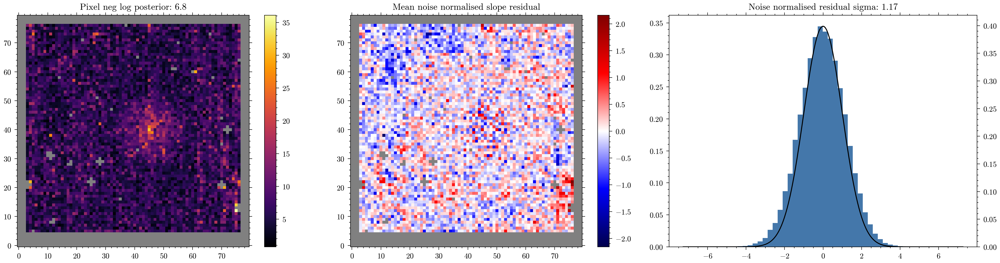

F380M Science TD-PDS-70 49


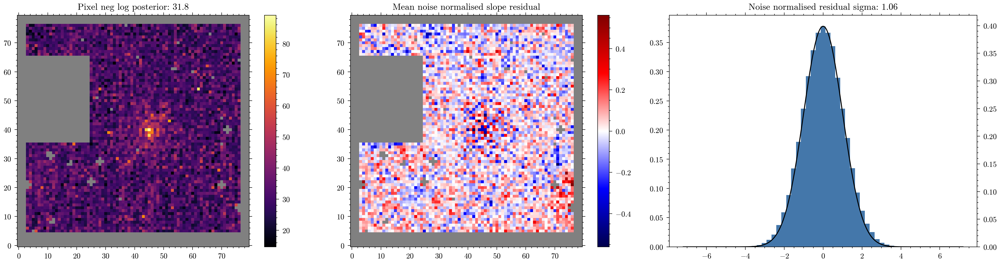

F430M Calibrator HD 228337 20


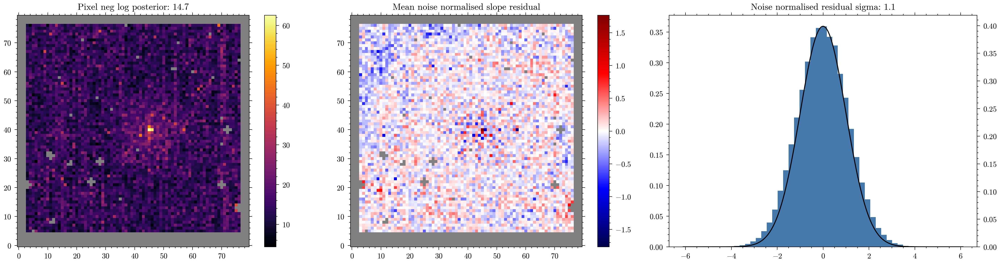

F430M Science TD-PDS-70 64


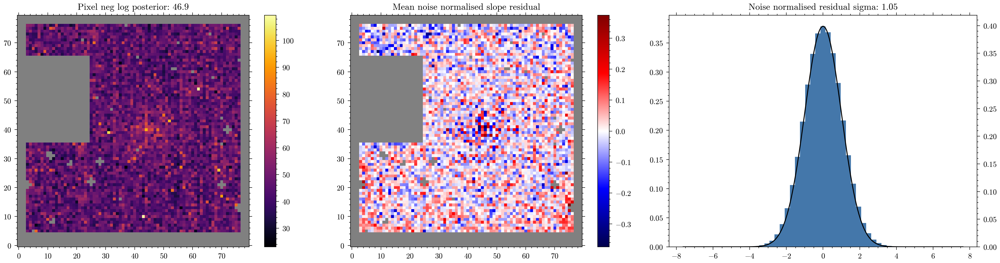

F480M Calibrator HD 228337 29


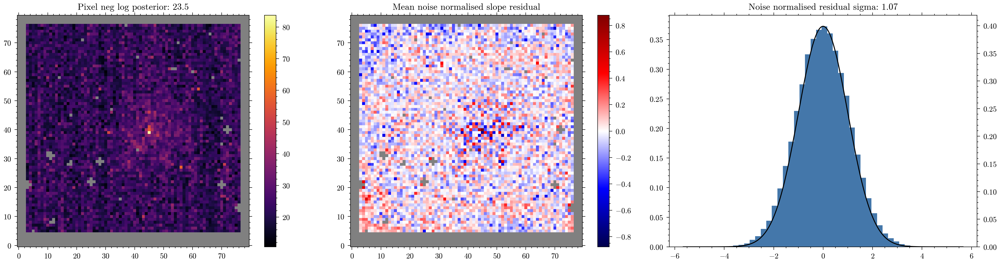

F480M Science TD-PDS-70 96


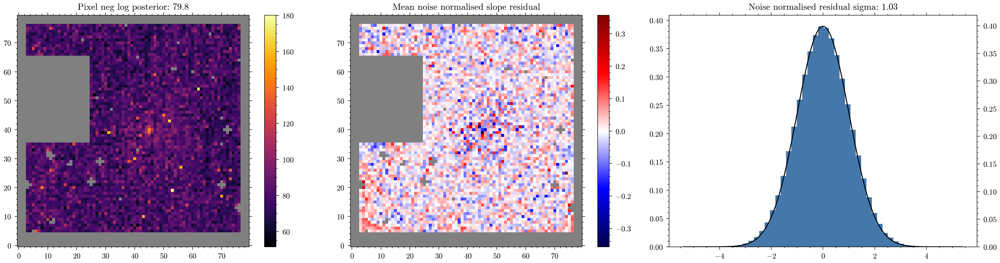

In [ ]:
for filt in ["F380M", "F430M", "F480M"]:
    for exp in exposures:
        if exp.filter == filt:
            exp_type = "Calibrator" if exp.calibrator else "Science"
            print(exp.filter, exp_type, exp.star, exp.ngroups)
            amigo.plotting.summarise_fit(final_model, exp)

In [ ]:
# np.save("files/bgmaskparams_pds70.npy", final_model.params, allow_pickle=True)

# final_model = model.set(
#     "params", np.load("files/bgmaskparams_pds70.npy", allow_pickle=True).item()
# )

In [ ]:
import jax.tree as jtu
from tqdm.notebook import tqdm
from amigo.fisher import FIM


fmats = {}
for exp in tqdm(exposures):
    loglike_fn = lambda model: -np.nansum(exp.loglike(model))
    params = [exp.map_param("amplitudes"), exp.map_param("phases")]
    fmat = FIM(final_model, params, loglike_fn, reduce_ram=True, batch_size=10)
    fmats[exp.get_key("phases")] = fmat

  0%|          | 0/6 [00:00<?, ?it/s]

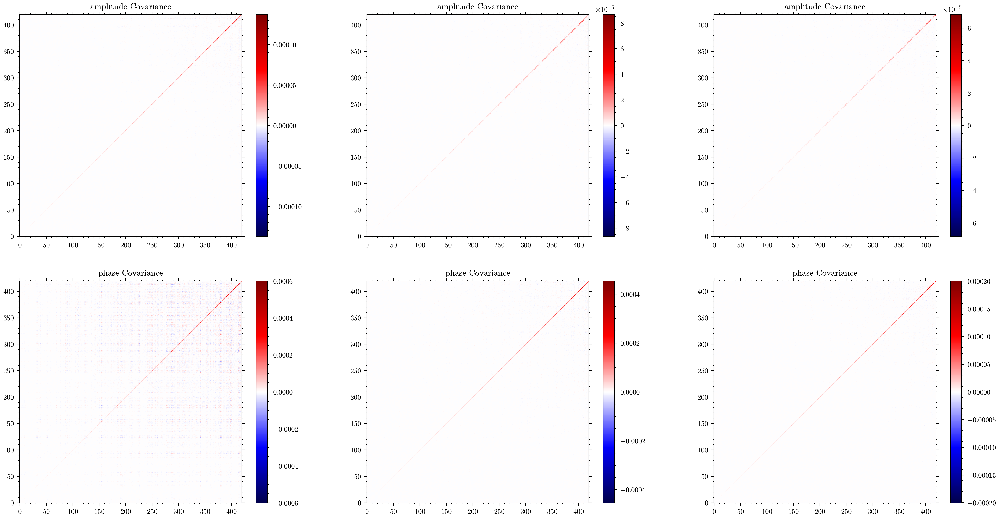

In [ ]:
full_covs = jtu.map(lambda x: np.linalg.inv(x), fmats)

n = model.vis_model.n_basis
amp_covs = jtu.map(lambda x: x[:n, :n], full_covs)
phase_covs = jtu.map(lambda x: x[n:, n:], full_covs)

covs = {
    "amplitudes": amp_covs,
    "phases": phase_covs,
}

plt.figure(figsize=(20, 10))
for i, key in enumerate(amp_covs):
    if i > 5:
        break

    if i < 3:
        param = "amplitude"
        cov = amp_covs[key]
    else:
        param = "phase"
        cov = amp_covs[key]
    plt.subplot(2, 3, i + 1)
    plt.title(f"{param} Covariance")
    v = np.nanmax(np.abs(cov))
    plt.imshow(cov, seismic, vmin=-v, vmax=v)
    # plt.imshow(np.log10(np.abs(cov)), inferno)
    plt.colorbar()
plt.show()

In [ ]:
fit_outputs = {
    "n_basis": final_model.vis_model.n_basis,
}

for exp in exposures:
    get_fn = lambda param: final_model.get(exp.map_param(param))
    fit_outputs[exp.key] = {
        "star": exp.star,
        "calibrator": exp.calibrator,
        "filter": exp.filter,
        "parang": exp.parang,
        "defocus": final_model.get(exp.map_param("defocus")),
        "n_basis": final_model.vis_model.n_basis,
        "fishers": fmats[exp.get_key("phases")],
        "amp_cov": amp_covs[exp.get_key("phases")],
        "phase_cov": phase_covs[exp.get_key("phases")],
        **{param: get_fn(param) for param in final_state.keys()},
    }

np.save(output_path + f"io_visibilities", fit_outputs, allow_pickle=True)